<img style="float:left" width="70%" src="pics/escudo_COLOR_1L_DCHA.png">
<img style="float:right" width="15%" src="pics/PythonLogo.svg">
<br style="clear:both;">

<h2 style="display: inline-block; padding: 4mm; padding-left: 2em; background-color: navy; line-height: 1.3em; color: white; border-radius: 10px;">Segmentación de imágenes mediante técnicas de agrupamiento</h2>

### K-Means, Fuzzy C-Means y Mixtura de Gausianas
#### Author: Pedro Latorre Carmona
#### Curso: 2023-2024

Versión 1.0

---

En esta práctica, vamos a ver la aplicación de tres técnicas siguientes de *clustering*, a imágenes:

1. K-Means
2. Fuzzy C-Means
3. Mixtura de Gausianas

### K-Means

El algoritmo más común utiliza una técnica de refinamiento iterativo. Debido a su ubicuidad a menudo se llama el algoritmo k-medias, también se le conoce como algoritmo de Lloyd, sobre todo en la comunidad informática.

Dado un conjunto inicial de $k$ centroides $m_{1}^{(1)},\ldots,m_{k}^{(1)}$, (véase más abajo), el algoritmo continúa alternando entre dos pasos:

- **Paso de asignación**: Asigna cada observación al grupo con la media más cercana (es decir, la partición de las observaciones de acuerdo con el diagrama de Voronoi generado por los centroides).

    $S_{i}^{(t)}={\big \{}x_{p}:{\big \|}x_{p}-m_{i}^{(t)}{\big \|}\leq {\big \|}x_{p}-m_{j}^{(t)}{\big \|};\ \forall \ 1\leq j\leq k{\big \}}$

Donde cada $x_{p}$ va exactamente dentro de un $S^{(t)}_i$, incluso aunque pudiera ir en dos de ellos.

- **Paso de actualización**: Calcular los nuevos centroides como el centroide de las observaciones en el grupo.

    $\mathbf {m} _{i}^{(t+1)}={\frac {1}{|S_{i}^{(t)}|}}\sum _{\mathbf {x} _{j}\in S_{i}^{(t)}}\mathbf {x} _{j}$

El algoritmo se considera que ha convergido cuando las asignaciones ya no cambian.

---
### Fuzzy C-Means

El procedimiento general de los algoritmos Fuzzy c-Means puede formalizarse en los siguientes pasos:

1. Fijar $c, m, A,\|k\|_{A}$. Elegir una matriz inicial $U^{(0)}\in M_{fc}$.

2. Calcular los centros de los grupos con la fórmula: 

    $\mu_{i}=\displaystyle{\frac {\sum \limits _{k=1}^{n}(u_{ik})^{m}x_{k}}{\sum \limits _{k=1}^{n}(u_{ik})^{m}}};1\leq i\leq c$.

3. Actualizar la matriz de partición difusa $U = [u_{ik}]$ con 

    $u_{ik}=\left(\sum \limits _{j=1}^{c}\left({\frac {d_{ik}}{d_{jk}}}\right)^{\frac {2}{m-1}}\right)^{-1};1\leq k\leq n;1\leq i\leq c$

4. Si se alcanzó el criterio de parada, terminar. En caso contrario, regresar al paso 2.

Algunos de los criterios de parada más utilizados son:

- Un número máximo de iteraciones
- Que la variación en la matriz U sea muy pequeña:

$\|U^{k+1}-U^{k}\|<\epsilon$.

---

### Mixtura de Gausianas (Mixture of Gaussians, o MoGs)

El algoritmo de mixtura de Gausianas intenta resolver e inferir cuáles son las características, número y peso de un conjunto de Gausianas, en un espacio $D-$dimensional que permitirían modelizar una determinada distribución de datos.

Supongamos un **vector de características** que representa un dato que queremos clasificar. La distribución de probabilidad de ese vector de características a lo largo del espacio que lo define se puede poner como:

$p(\mathbf{x}) = \sum_{j=1}^{m} p(\Omega_{j})\cdot p(\mathbf{x}|\Omega_{j})$

Una función Gausiana en un espacio $D-$dimensional puede escribirse de la siguiente forma:

$p(\mathbf{x}|\Omega_{j})=\frac{1}{(2\pi)^{\frac{d}{2}}|\Sigma_{j}|^{\frac{1}{2}}}\exp\left(-\frac{1}{2}([\mathbf{x}-\mathbf{\mu}_{j}]^{T}\Sigma_{j}^{-1}[\mathbf{x}-\mathbf{\mu}_{j}])\right)$

donde:

1. $\mathbf{\mu}_{j}$ es el vector que representa las coordenadas del **centroide** j-ésimo
2. $\Sigma_{j}$ es la matriz de covarianza asociada al *clúster* j-ésimo

---
Tenéis las siguientes 3 imágenes:

1. **Colorful.jpg**
2. **Keyboard.jpg**
3. **PoolBar.jpg**

Hay que aplicar los métodos **K-Means**, **Fuzzy C-Means**, y **Mixtura de Gausianas** sobre estas tres imágenes, analizando el efecto de los diferentes parámetros sobre la segmentación de dichas imágenes. Así, por ejemplo, habría que ver cómo el cambio en el número de grupos, afecta al resultado, así como parámetros específicos, como puede ser el número de iteraciones, o *umbrales* correspondientes.

---

### **Alumna:** Jimena Arnaiz González

In [2]:
%matplotlib inline

In [3]:
import math
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

from skimage import io
from sklearn.cluster import KMeans

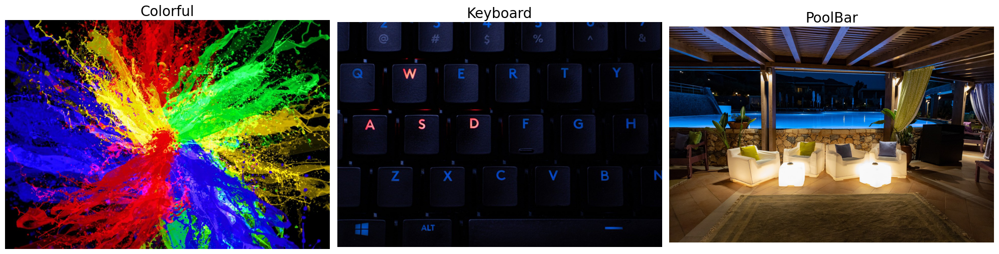

In [41]:
image = io.imread('Colorful.jpg')
imageB = io.imread('Keyboard.jpg')
imageC = io.imread('PoolBar.jpg')

# Visualización de las imágenes
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(20, 8))

ax[0].imshow(image)
ax[0].set_title('Colorful', fontsize=20)

ax[1].imshow(imageB)
ax[1].set_title('Keyboard', fontsize=20)

ax[2].imshow(imageC)
ax[2].set_title('PoolBar', fontsize=20)

for a in ax:
    a.axis('off')

fig.tight_layout()
plt.show()

### K-means

En este método de segmentación vamos a ver cómo afecta el número de clusters y el número máximo de iteraciones.

**Cómo afecta el parámetro c**

C:\Users\jimen\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\jimen\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\jimen\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\jimen\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of

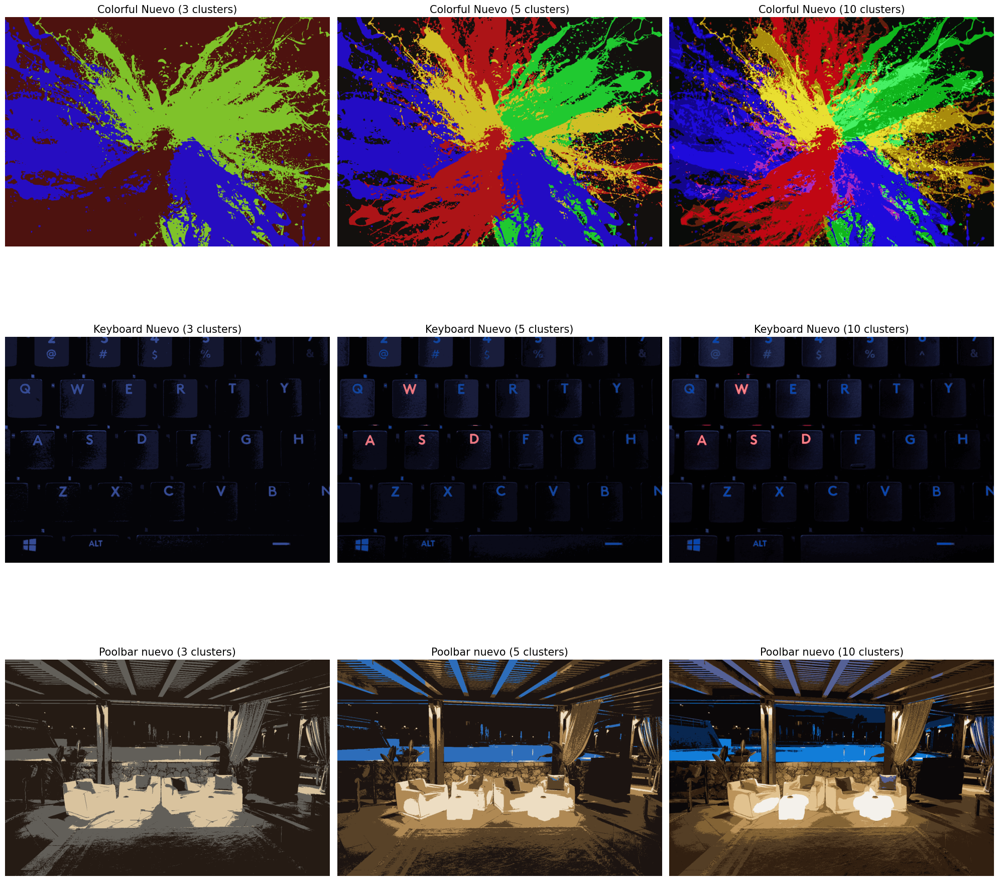

In [12]:
# K-Means y visualización
def apply_kmeans_and_show(image, title, n_clusters):
    
    # Reorganizar la imagen en una matriz 2D donde cada fila representa un píxel y cada columna representa un canal de color
    h, w, c = image.shape
    image_flat = image.reshape((h*w, c))
    
    # Crear un modelo kmeans con el número especificado de clústeres
    kmeans_model = KMeans(n_clusters)
    
    # Ajustar el modelo KMeans a la imagen plana, obteniendo las etiquetas de clúster para cada píxel
    cluster_labels = kmeans_model.fit_predict(image_flat)
    
    # Redondear los centros de los clústeres al entero más cercano y convertirlos a enteros
    rgb_cols = kmeans_model.cluster_centers_.round(0).astype(int)
    
    # Reemplazar cada píxel en la imagen con el color del centro de clúster correspondiente
    img_quant = np.reshape(rgb_cols[cluster_labels], (h, w, c))
    
    # Devolver la imagen cuantizada y el título proporcionado
    return img_quant, title

# Aplicar K-Means y mostrar las imágenes en una matriz
fig, axes = plt.subplots(3, 3, figsize=(20, 20))

# Iterar sobre las imágenes y los números de clusters
for i, (img, title) in enumerate([(image, 'Colorful'), (imageB, 'Keyboard'), (imageC, 'Poolbar')]):
    for j, n_clusters in enumerate([3, 5, 10]):
        img_quant, _ = apply_kmeans_and_show(img, title, n_clusters)
        axes[i, j].imshow(img_quant)
        axes[i, j].set_title(f'{title} ({n_clusters} clusters)', fontsize=15)
        axes[i, j].axis('off')

plt.tight_layout()
plt.show()


***Conclusiones sobre la variación del número de clusters***

En este método de segmentación hemos variado el número de clusters (c). Este parámetro determina la cantidad de segmentos o clusters en los que se dividirá la imagen.

En la primera imagen, al tener tantos colores, podemos ver muy bien la evolución que se tiene poniendo más o menos clusters. Al poner solo 3, podemos ver que la imagen tiene solo 3 colores bastante apagados, sin practicamente diferenciar los que teníamos en la imagen original. A medida que aumentamos los clusters , podemos ver cómo va ganando detalle y se consiguen diferenciar prácticamente todos los colores de la imagen original.

En la segunda imagen, al tener tan pocos colores, la diferenciación entre las imágenes de más de 4-5 clusters, es muy difícil de apreciar, aunque sí que se puede ver algún detalle más. En mi caso, con 3 clusters podemos ver que solo toma el color negro, un negro más claro para hacer el reflejo y el azul. Con 5 clusters ya incluye el rojo y las teclas están mejor definidas que en la imagen anterior. Con 10 clusters, a pesar de ser muy parecido a la imagen de 5 clusters, podemos ver cómo ha coloreado de un rojo más potente las 3 rayas que están encima de las teclas A, S y D.

En la tercera imagen, al tener tantos colores en gamas parecidas, a partir de 5 clusters, lo que hace es que se va detallando la imagen. Con menos clusters (3) podemos ver cómo la imagen no es nisiquiera en color, pues usa una gama de grises/negros. Con 5 clusters podemos ver cómo tiene ya la base principal de la imagen original, aunque no es tan detallada. Y finalmente con 10 clusters vemos que es parecida a la anterior, pero ya cuenta con detalles en el fondo, pudiendo apreciar el cielo y una construcción al fondo. Además, los cojines están más diferenciados por un color más oscuro, aparte de tener una mayor iluminación los sillones.


**Cómo afecta el número máximo de iteraciones**

C:\Users\jimen\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\jimen\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\jimen\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\jimen\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of

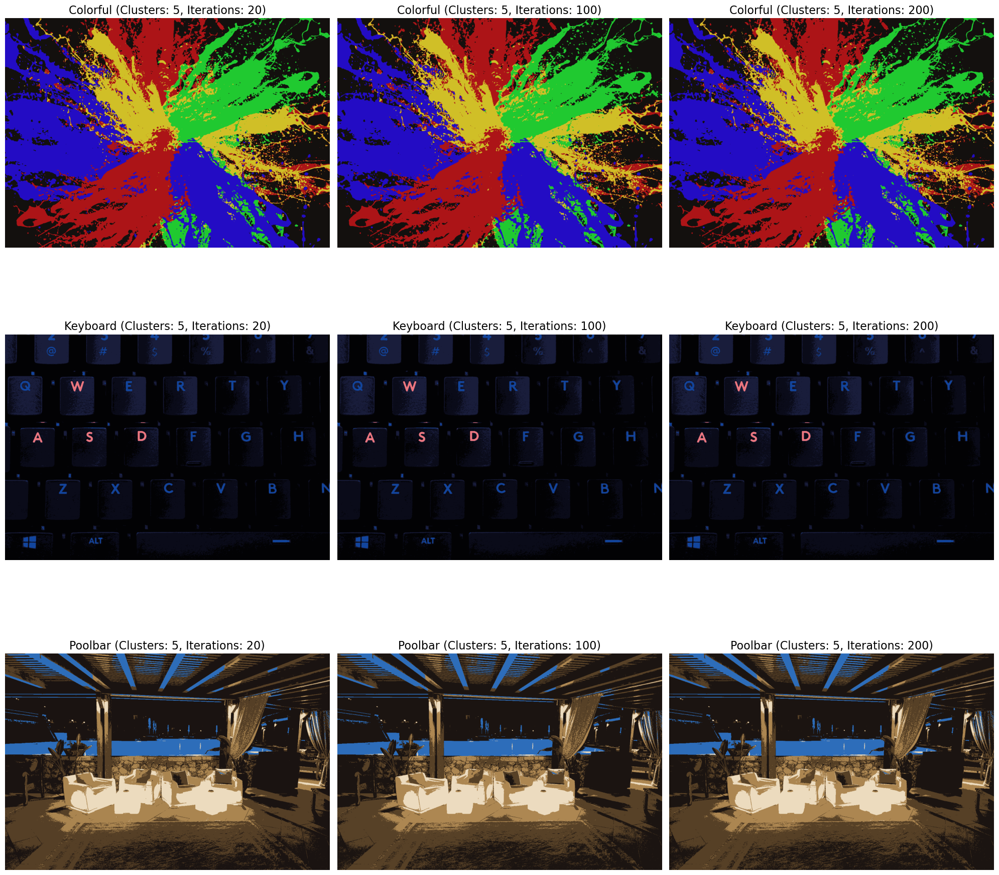

In [44]:
from sklearn.cluster import KMeans

# Función para aplicar K-Means y mostrar la imagen resultante
def apply_kmeans_and_show(image, title, n_clusters, max_iter):
    
    # Reorganizar la imagen en una matriz 2D donde cada fila representa un píxel y cada columna representa un canal de color
    h, w, c = image.shape
    image_flat = image.reshape((h*w, c))
    
    # Crear un modelo KMeans con el número especificado de clústeres y las iteraciones proporcionadas
    kmeans_model = KMeans(n_clusters=n_clusters, max_iter=max_iter)
    
    # Ajustar el modelo KMeans a la imagen plana, obteniendo las etiquetas de clúster para cada píxel
    cluster_labels = kmeans_model.fit_predict(image_flat)
    
    # Redondear los centros de los clústeres al entero más cercano y convertirlos a enteros
    rgb_cols = kmeans_model.cluster_centers_.round(0).astype(int)
    
    # Reemplazar cada píxel en la imagen con el color del centro de clúster correspondiente
    img_quant = np.reshape(rgb_cols[cluster_labels], (h, w, c))
    
    # Devolver la imagen cuantizada y el título proporcionado
    return img_quant, title


n_clusters_values = 5  # Números de clusters

max_iter_values = [20, 100, 200] # Iteraciones a probar

# Configurar el tamaño de la cuadrícula de subgráficos
fig, axes = plt.subplots(3, len(max_iter_values), figsize=(20, 20))

# Iterar sobre cada imagen
for i, (img, title) in enumerate([(imageA, 'Colorful'), (imageB, 'Keyboard'), (imageC, 'Poolbar')]):
    # Iterar sobre cada valor de iteraciones
    for j, max_iter in enumerate(max_iter_values):
        img_quant, _ = apply_kmeans_and_show(img, title, n_clusters_values, max_iter)  # Cambiar aquí
        axes[i, j].imshow(img_quant)
        axes[i, j].set_title(f'{title} (Clusters: {n_clusters_values}, Iterations: {max_iter})', fontsize=16)
        axes[i, j].axis('off')

plt.tight_layout()
plt.show()



***Conclusiones sobre el número máximo de iteraciones***

A simple vista no se aprecian cambios. La variación del número máximo de iteraciones no cambia en ningún aspecto las imágenes. 

---

### Fuzzy_Means

En este método de segmentación vamos a ver cómo afectan el número de clusters, el parámetro de fuzzificación y el número de iteraciones a las imágenes.

**Cómo afecta el número de clusters**

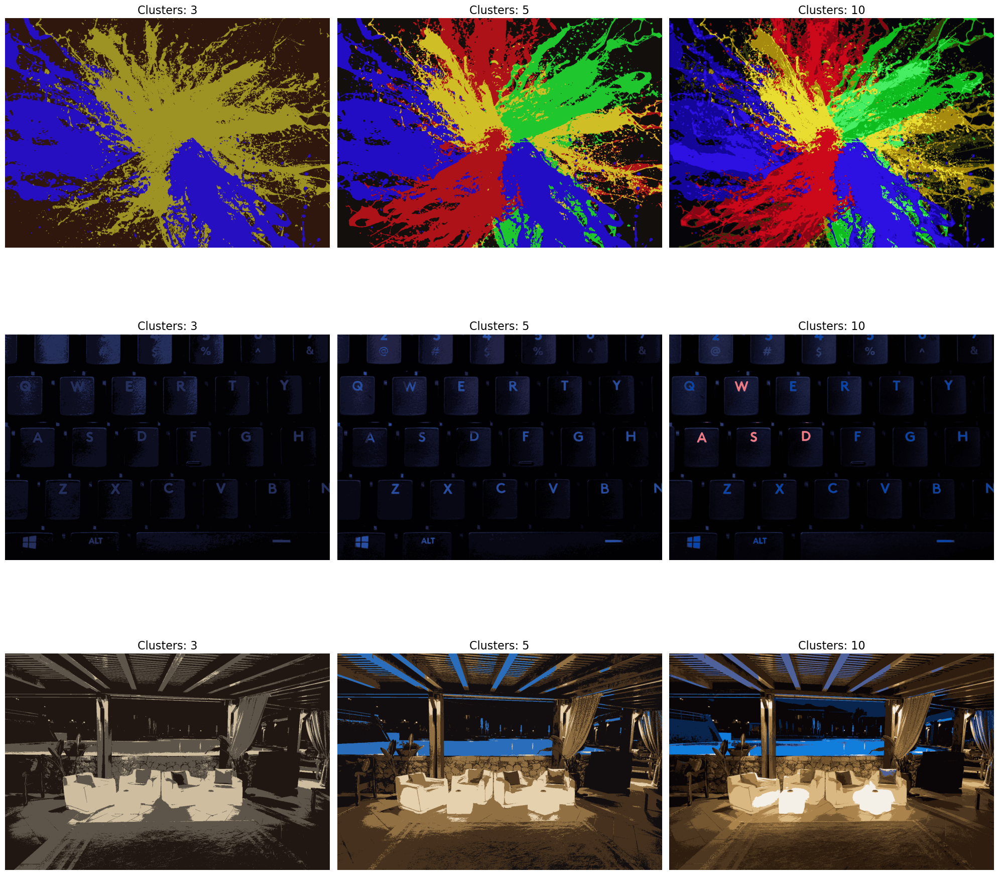

In [12]:
#tarda mucho en ejecutar porque carga todas las imagenes

from skimage import io, color
from skfuzzy import cmeans  #hay que instalar ----> conda install -c conda-forge scikit-fuzzy

# Lista de imágenes
images = [image, imageB, imageC]

# Números de clusters a probar
c_values = [3, 5, 10]  # Cambiar el orden según preferencia

# Configuración del algoritmo FCM
m = 2.0  # Parámetro de fuzzificación
max_iter = 100  # Número de iteraciones fijo
error = 0.005  # Criterio de parada

# Configurar el tamaño de la cuadrícula de subgráficos
fig, axes = plt.subplots(3, 3, figsize=(20, 20)) 

# Iterar sobre cada imagen
for j, image in enumerate(images):
    # Aplanar y normalizar la imagen directamente
    image_flat = image.reshape((-1, 3)).astype(float) / 255.0
    
    # Iterar sobre cada número de clusters
    for i, c in enumerate(c_values):
        cntr_image, u_image, _, _, _, _, _ = cmeans(image_flat.T, c, m, error, max_iter, seed=0)
                
        # Obtener las etiquetas de cluster para cada píxel
        labels = np.argmax(u_image, axis=0)
                
        # Reconstruir la imagen con los centros de cluster
        clustered_image = np.zeros_like(image_flat)
        for l in range(c):
            cluster_points = image_flat[labels == l]
            clustered_image[labels == l] = np.mean(cluster_points, axis=0)

        # Revertir la normalización y remodelar la imagen
        clustered_image = (clustered_image * 255.0).reshape(image.shape)
                
        # Visualizar las imágenes clusterizadas
        axes[j, i].imshow(clustered_image.astype(np.uint8))
        axes[j, i].set_title(f'Clusters: {c}', fontsize=16)
        axes[j, i].axis('off')

plt.tight_layout()
plt.show()


***Conclusiones sobre la variación de clusters***

En este método de segmentación hemos variado el número de clusters para ver el impacto que este parámetro tiene sobre las imágenes.

En la primera imagen, a medida que aumentamos los clusters podemos observar una evolución muy parecida a la que veíamos en el método K-means. Pasamos de tener muy pocos colores diferenciados (3 clusters) a una imagen más colorida pero sin tanto detalle (5 clusters), hasta una imagen con más tonalidades y con más detalle (10 clusters).

En la segunda, podemos ver una mejor diferenciación entre las imágenes respecto a K-means. Con 3 clusters solo contamos con colores de tonalidad negra y grisácea. Con 5, ya podemos diferenciar mejor las teclas del teclado además de tener el color azul para las letras. Por último, con 10 clusters podemos ver que el teclado es prácticamente idéntico al de la imagen original, contando ya con el color rojo en alguna de las teclas.

En la tercera, tenemos una evolución igual a la de K-means. A más clusters, más grupos de colores y más detalle.

**Cómo afecta el parámetro de fuzzificación y el número máximo de iteraciones**

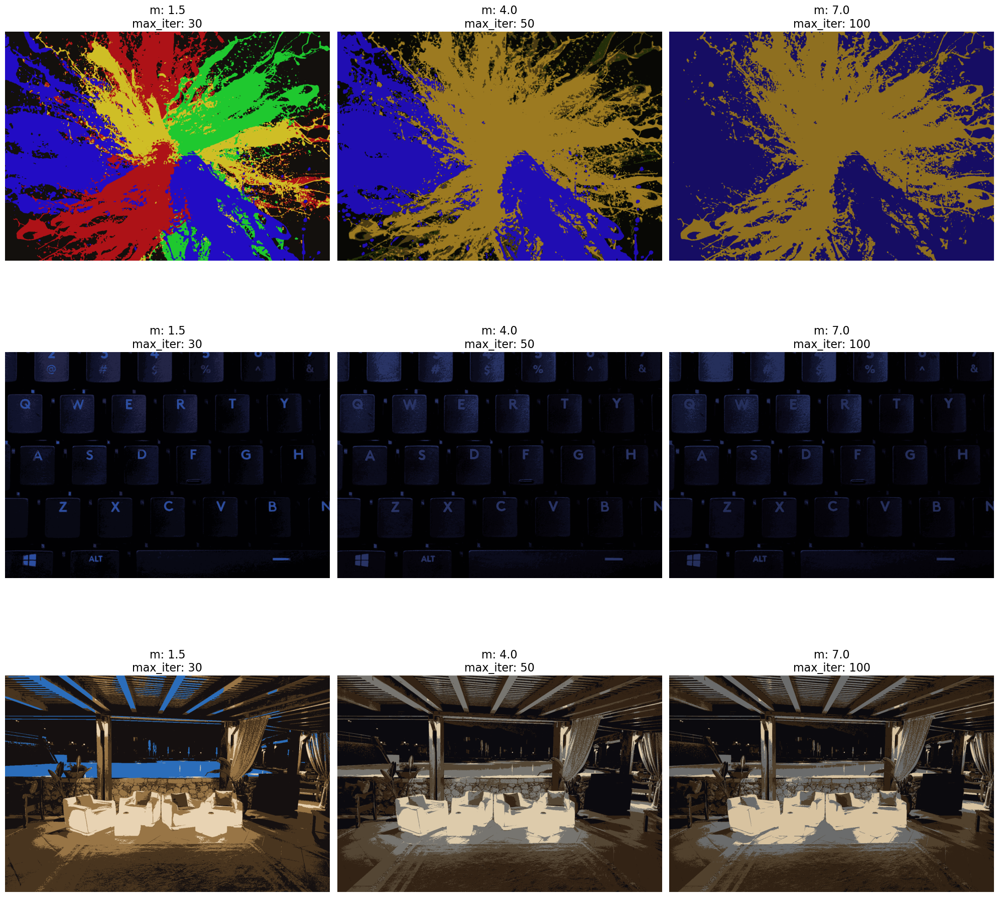

In [49]:
from skimage import io
from skfuzzy import cmeans

images = [image, imageB, imageC]

# Números de clusters a probar
c_values = [5]

# Configuración del algoritmo FCM
max_iter_values = [30, 50, 100]  # Números máximos de iteraciones a probar
m_values = [1.5, 4.0, 7.0]  # Parámetro de fuzzificación a probar
error = 0.005  # Criterio de parada

# Configurar el tamaño de la cuadrícula de subgráficos
fig, axes = plt.subplots(3, 3, figsize=(20, 20))

# Iterar sobre cada imagen
for j, image in enumerate(images):
    # Aplanar y normalizar la imagen directamente
    image_flat = image.reshape((-1, 3)).astype(float) / 255.0

    # Iterar sobre cada combinación de max_iter y m
    for col, m in enumerate(m_values):
        max_iter = max_iter_values[col]
        cntr_image, u_image, _, _, _, _, _ = cmeans(image_flat.T, c_values[0], m, error, max_iter, seed=0)

        # Obtener las etiquetas de cluster para cada píxel
        labels = np.argmax(u_image, axis=0)

        # Reconstruir la imagen con los centros de cluster
        clustered_image = np.zeros_like(image_flat)
        for l in range(c_values[0]):
            cluster_points = image_flat[labels == l]
            clustered_image[labels == l] = np.mean(cluster_points, axis=0)

        # Revertir la normalización y remodelar la imagen
        clustered_image = (clustered_image * 255.0).reshape(image.shape)

        # Visualizar las imágenes clusterizadas
        axes[j, col].imshow(clustered_image.astype(np.uint8))
        axes[j, col].set_title(f'm: {m}\nmax_iter: {max_iter}', fontsize=16)
        axes[j, col].axis('off')

# Eliminar subgráficos no utilizados
for i in range(len(images)):
    for j in range(len(m_values), 3):
        fig.delaxes(axes[i, j])

plt.tight_layout()
plt.show()


***Conclusiones sobre la variación del parámetro m y del múmero máximo de iteraciones***

En este caso, hemos dejado el valor fijo de 5 clusters y hemos variado el parámetro de fuzzificación (m), que controla la difuminación de la pertenencia de un píxel a un cluster y el número máximo de iteraciones (max_iter), parámetro que establece cuántas veces se repetirá el proceso de actualización de los centroides antes de considerar que el algoritmo ha convergido. 

En las imágenes vemos que cuanto menor es el m y el número de iteraciones, mejor se ve la imagen, usando colores más fieles a los de la imagen original. En cambio, al ser mayores los valores, las imágenes pierden color y se ven más apagadas. En general se ven peor, pues el parámetro m suaviza las fronteras entre los clusters, haciendo que la segmentación sea más difusa. Donde mejor se ve esa pérdida de apreciación de la imagen, es en Colorful y Keyboard de la tercera columna.

---

### Gaussianas

En este método de segmentación vamos a ver cómo afectan el número de clusters, el parámetro de tolerancia y el número de iteraciones a las imágenes.

**Cómo afecta el número de clusters**

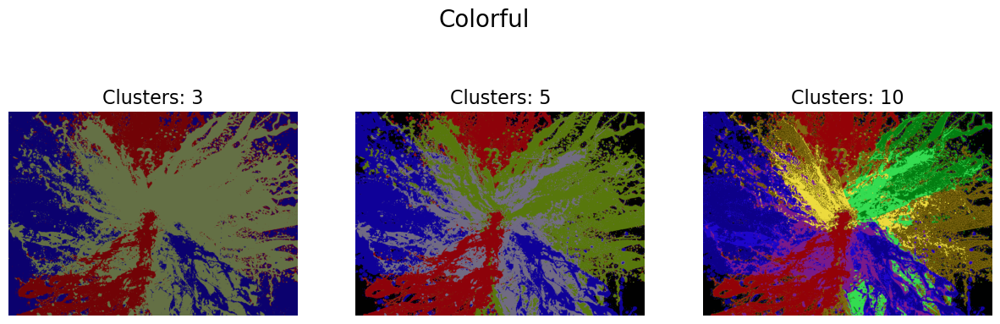

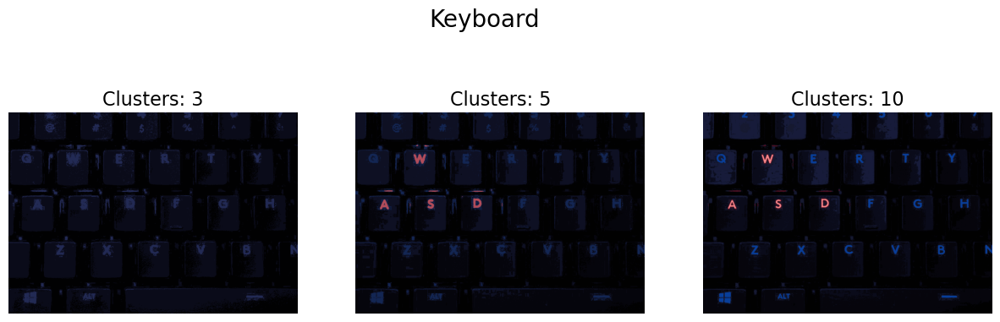

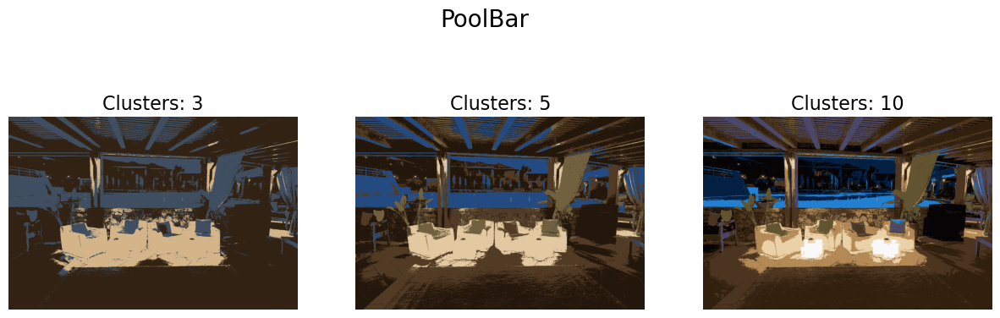

In [21]:
from skimage import io
from sklearn.mixture import GaussianMixture

# Función para aplicar MoG y visualizar resultados
def apply_gaussian_mixture_and_visualize(image, n_components_values, title):
    # Aplanar la imagen y normalizar los valores de píxeles al rango [0, 1]
    image_flat = image.reshape((-1, 3)).astype(float) / 255.0

    # Configuración del algoritmo MoG
    max_iter = 100  # Número máximo de iteraciones
    tolerance = 1e-3  # Tolerancia para la convergencia

    # Crear una matriz de subgráficos
    fig, axes = plt.subplots(1, len(n_components_values), figsize=(15, 5))

    # Aplicar MoG y visualizar resultados para cada número de componentes
    for i, n_components in enumerate(n_components_values):
        # Aplicar MoG a la imagen
        gmm = GaussianMixture(n_components=n_components, max_iter=max_iter, tol=tolerance, random_state=0)
        gmm.fit(image_flat)

        # Obtener las etiquetas de cluster para cada píxel
        labels = gmm.pre
        dict(image_flat)

        # Reconstruir la imagen con los centros de cluster
        clustered_image = gmm.means_[labels].reshape(image.shape)

        # Visualizar la imagen clusterizada
        axes[i].imshow(clustered_image)
        axes[i].set_title(f'Clusters: {n_components}', fontsize=16)
        axes[i].axis('off')

    plt.suptitle(title, fontsize=20)
    plt.show()

# Números de clusters a probar
n_components_values = [3, 5, 10]

# Aplicar MoG y visualizar resultados para cada imagen
apply_gaussian_mixture_and_visualize(image, n_components_values, 'Colorful')
apply_gaussian_mixture_and_visualize(imageB, n_components_values, 'Keyboard')
apply_gaussian_mixture_and_visualize(imagec, n_components_values, 'PoolBar')


***Conclusiones sobre la variación del número de clusters***

En la evolución de las 3 imágenes (Colorful, Keyboard y Poolbar), podemos observar que al tener un menor número de clusters, las imagenes se ve más apagada y con solo c (número de clusters) colores. A medida que se aumentan los clusters, hay más colores y la imagen está un poco más saturada/brillante (se puede apreciar en las imágenes de 10 clusters).



**Cómo afecta el parámetro de tolerancia y el número máximo de iteraciones**

C:\Users\jimen\anaconda3\Lib\site-packages\sklearn\mixture\_base.py:268: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  warnings.warn(
C:\Users\jimen\anaconda3\Lib\site-packages\sklearn\mixture\_base.py:268: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  warnings.warn(
C:\Users\jimen\anaconda3\Lib\site-packages\sklearn\mixture\_base.py:268: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  warnings.warn(
C:\Users\jimen\anaconda3\Lib\site-packages\sklearn\mixture\_base.py:268: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  warnings.warn(
C:\Users\jimen\anaconda3\Lib\site-packages\sklearn\mixture\_base.py:268:

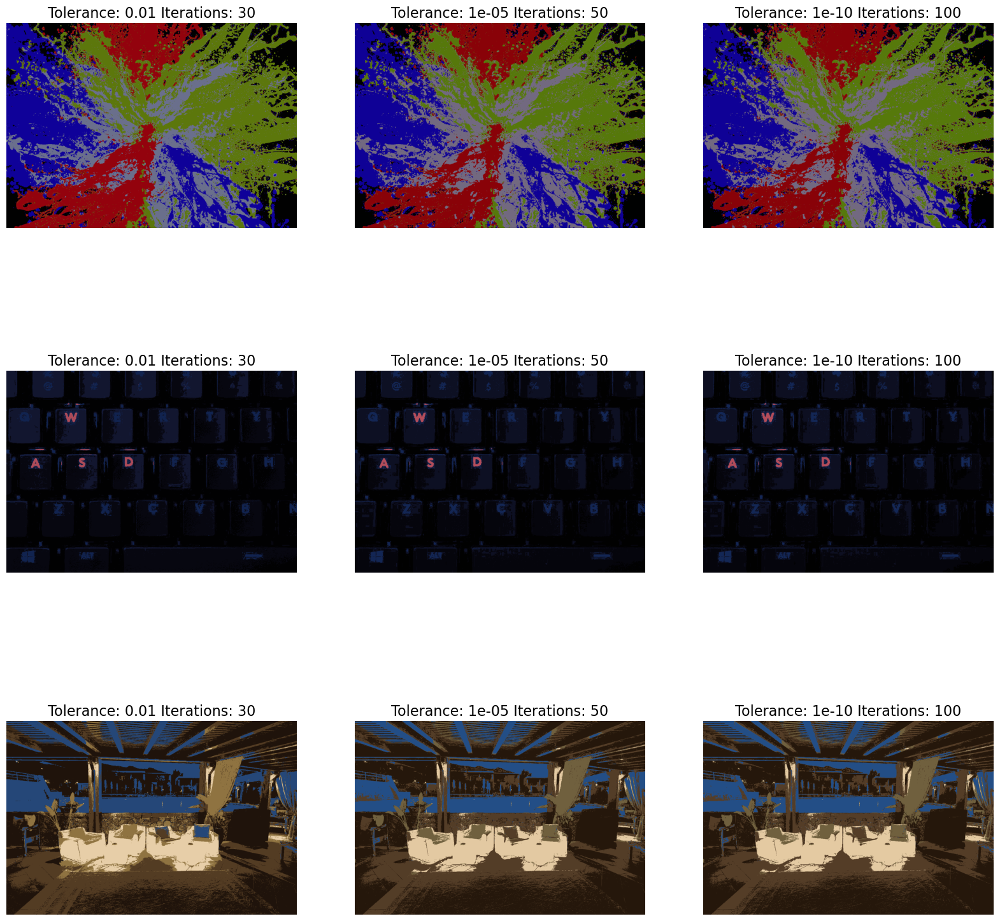

In [35]:
from sklearn.mixture import GaussianMixture

# Cargar las imágenes
imageA = io.imread('Colorful.jpg')
imageB = io.imread('Keyboard.jpg')
imageC = io.imread('Poolbar.jpg')

# Lista de imágenes
images = [imageA, imageB, imageC]

# Configuración del algoritmo MoG
n_components = 5  # Número de componentes (clusters) fijo
max_iter_values = [30, 50, 100]  # Números máximos de iteraciones a probar
tolerance_values = [1e-2, 1e-5, 1e-10]  # Tolerancias a probar

# Crear una matriz de subgráficos
fig, axes = plt.subplots(len(images), len(tolerance_values), figsize=(20, 20))

# Iterar sobre cada imagen
for row, image in enumerate(images):
    # Aplanar la imagen y normalizar los valores de píxeles al rango [0, 1]
    image_flat = image.reshape((-1, 3)).astype(float) / 255.0

    # Iterar sobre cada combinación de tolerancia e iteraciones
    for col, tolerance in enumerate(tolerance_values):
        max_iter = max_iter_values[col]

        # Aplicar MoG a la imagen
        gmm = GaussianMixture(n_components=n_components, max_iter=max_iter, tol=tolerance, random_state=0)
        gmm.fit(image_flat)

        # Obtener las etiquetas de cluster para cada píxel
        labels = gmm.predict(image_flat)

        # Reconstruir la imagen con los centros de cluster
        clustered_image = gmm.means_[labels].reshape(image.shape)

        # Visualizar la imagen clusterizada
        axes[row, col].imshow(clustered_image)
        axes[row, col].set_title(f'Tolerance: {tolerance} Iterations: {max_iter}', fontsize=12)
        axes[row, col].axis('off')

plt.show()


***Conclusiones sobre la variación del parámetro tolerancia y del múmero máximo de iteraciones***

En este caso, hemos dejado el valor fijo de 5 clusters y hemos variado el parámetro de tolerancia (tolerance). Este úiltimo, controla la difuminación de la pertenencia de un píxel a un cluster. 
  
Podemos observar alguna diferencia entre la primera columna y la última, pues la columna del medio, la cual cuenta con valores intermedios para la tolerancia y el número de iteraciones, es prácticamente idéntica a la de la última columna.

La diferencia un poco más notable ocurre en Keyboard, a medida que disminuye la tolerancia, parece que se visualiza peor la imagen, como más difuminada o menos enfocada. También en Poolbar podemos apreciar que en la primera columna la imagen parece más brillante que en el resto. En cambio, en Colorful no hay casi diferencia.

